## Market research through data science

webscraping reddit and twitter for sentiment analysis and word cloud

In [1]:
import praw
import pandas as pd
import datetime
import numpy as np
from matplotlib import pyplot as plt

/Users/xiaoxiangma/.local/lib/python3.7/site-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.25.8) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


### Scraping Reddit

In [2]:
reddit = praw.Reddit(client_id='1lfzyXyo7eF3Bw', client_secret='us72IDJ9X-BFESjX8TFqbUTvf7U', user_agent='scraper')

In [3]:
def get_comments_from_id(post_id):
    comments_list = []
    submission = reddit.submission(id=post_id)
    submission.comments.replace_more(limit=0)
    for comment in submission.comments.list():
        comments_list.append(comment.body)
    return comments_list

In [4]:
def gen_df(keyword, count):
    posts = []
    all= reddit. subreddit("all") 

    for post in all.search(keyword, limit=count): 
        posts.append([post.title, post.score, post.id, post.subreddit, post.url, post.num_comments, post.selftext, datetime.datetime.fromtimestamp(post.created)])
    posts = pd.DataFrame(posts,columns=['title', 'score', 'id', 'subreddit', 'url', 'num_comments', 'body', 'created'])

    comments = [get_comments_from_id(i) for i in posts['id']]
    posts['comments'] = pd.DataFrame(([c] for c in comments),columns=['comments'])
    return posts

In [5]:
def get_body_comments_text(df):
    all_body = [i for i in df['body'].values if i != ""]
    all_comments = []
    for i in df['comments'].values:
        all_comments = all_comments + i
    return all_body + all_comments

In [6]:
def gen_text_reddit(keyword, limit):
    df = gen_df(keyword, limit)
    return get_body_comments_text(df)

In [7]:
symptom_checker = gen_df("symptom checker", 30)

In [8]:
symptom_checker_texts = get_body_comments_text(symptom_checker)

In [9]:
symptom_checker

,title,score,id,subreddit,url,num_comments,body,created,comments
0,Need a new good reason to boycott Babylon? Doc...,951,g0rgkg,alberta,https://twitter.com/DrMurphy11/status/11975897...,67,,2020-04-14 00:56:48,[Commenting because there seems to be people c...
1,New ECU research finds 'Dr. Google' is almost ...,52,glu6qb,science,https://onlinelibrary.wiley.com/doi/full/10.56...,13,,2020-05-18 08:02:06,[My internal search engine throws out the foll...
2,A study of 36 international mobile and web-bas...,36,gp30ul,science,https://www.eurekalert.org/pub_releases/2020-0...,10,,2020-05-23 15:00:52,"[Welcome to r/science! Our team of 1,500+ mode..."
3,NHS 111 says to fill in the online symptom che...,49,gbgzjd,britishproblems,https://www.reddit.com/r/britishproblems/comme...,6,Bonus problem: Before you’re seen to you need ...,2020-05-01 16:13:48,[A neighbour I've been caring for has been fob...
4,UMD graduates create virtual COVID-19 symptom ...,2,grlnqu,maryland,https://www.wmar2news.com/news/coronavirus/umd...,1,,2020-05-27 19:21:23,"[For more information, please visit the [Maryl..."
5,Oklahoma health department launches online cor...,48,fx7ghv,CoronavirusOklahoma,https://www.koco.com/article/oklahoma-health-d...,7,,2020-04-08 18:30:28,[I wonder what requiring so much PII will do f...
6,"Symptom checker...is is the flu, or allergies ...",273,fh7thu,coolguides,https://i.redd.it/7i48111b35m41.jpg,18,,2020-03-12 04:51:38,[I love when I see something of actually real ...
7,Regional health officials and first responders...,8,g368cz,Portland,https://www.portlandoregon.gov/fire/article/75...,6,,2020-04-17 21:17:13,[>The symptoms you report have commonly been o...
8,We just started to self isolate yesterday. No ...,17,fvw9rv,COVID19_Testimonials,https://www.reddit.com/r/COVID19_Testimonials/...,8,"Saturday day time I felt achy, scratchy throat...",2020-04-06 14:18:11,"[Not a doctor, but those symptoms do sound con..."
9,COVID-19 Symptom Checker Bot,2,g4oc1f,TelegramBots,https://www.reddit.com/r/TelegramBots/comments...,5,Hi everyone!\n\nOur team built a Telegram bot ...,2020-04-20 11:28:22,"[2 suggestions: \n1) emphasize beforehand, t..."


In [10]:
symptom_checker_texts

['Bonus problem: Before you’re seen to you need to be “too unwell to do your daily activities such as use your phone”.',
 'Saturday day time I felt achy, scratchy throat and kept sneezing- I thought it could be hayfever.\n\nSaturday night I started to get really badly achy all over, a very tight painful chest and coughing. Then chills, sweats and burning up. I kept waking up during the night in so much pain and felt like I couldn’t breathe and I sweated so much that now our bed is soaked. \nMy fiancé also had aches Saturday night, chills, headache and he threw up Sunday morning. \n\nSunday:\nHe thought maybe we both have food poisoning but I have no stomach cramps or nausea or anything. We both felt terrible though. I took paracetamol to see if it’d help headache and aches but it definitely hasn’t. We were both super achy & I was still super sweaty. Chills and cough had stopped a bit. I was still coughing but not as bad. It’s definitely a new cough too that just randomly appeared along

### Scraping Twitter

In [11]:
import twint

In [12]:
import nest_asyncio
nest_asyncio.apply()

In [13]:
import sys
import os

class HiddenPrints:
    def __enter__(self):
        self._original_stdout = sys.stdout
        sys.stdout = open(os.devnull, 'w')

    def __exit__(self, exc_type, exc_val, exc_tb):
        sys.stdout.close()
        sys.stdout = self._original_stdout

In [14]:
def get_tweets(search, limit=100):
    c = twint.Config()
    c.Search = search
    c.Limit = limit
    c.Pandas = True
    c.Pandas_clean = True

    with HiddenPrints():
        print(twint.run.Search(c))
    return twint.output.panda.Tweets_df[["username","tweet"]]

In [15]:
tweets = get_tweets("symptom checker", limit=10)

In [16]:
tweets

,username,tweet
0,dr_fionac,I just compared the CDC COVID symptom checker ...
1,treeinspired,🆕 🖥 Now also for macOS: https://apple.co/2L1O...
2,EPCPublicHealth,The CDC has identified additional symptoms of ...
3,NMCP1,The Department of Defense (DoD) has created a ...
4,Fleur_Journal,"Haaaa, that's pathetic. So it's just a copy of..."
5,NHBeaufort,MYTH vs. FACT: \n\nMYTH: I’m feeling under the...
6,SpectrumSharp,Are you experiencing unusual symptoms? 😟 If yo...
7,JalilaChildrens,Urinary and bowel elimination disorders can po...
8,North_Resists,How about Japanese Interment Camps during WW2 ...
9,advocatehealth,If you think you’ve been exposed to #coronavir...


### Word Cloud

In [17]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
%matplotlib inline


In [18]:
def generate_word_cloud(text):
    
    # Getting the text out of the tweets
#     text = tweets.tweet.values
    
    # adding movie script specific stopwords
    stopwords = set(STOPWORDS)
    stopwords.add("https")
    stopwords.add("xa0")
    stopwords.add("xa0'")
    stopwords.add("bitly")
    stopwords.add("bit")
    stopwords.add("ly")
    stopwords.add("twitter")
    stopwords.add("pic")

    wordcloud = WordCloud(
        background_color = 'white',
        width = 1000,
        height = 500,
        stopwords = stopwords).generate(str(text))
    plt.figure(figsize=(40,20))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
#     plt.figsize = [40, 20]
#     figsize : (float, float)
#     plt.rcParams['figure.figsize'] = [40, 20]

In [19]:
def gen_text_twitter(keyword, limit):
    tweets = get_tweets(keyword, limit=limit)
    return tweets.tweet.values

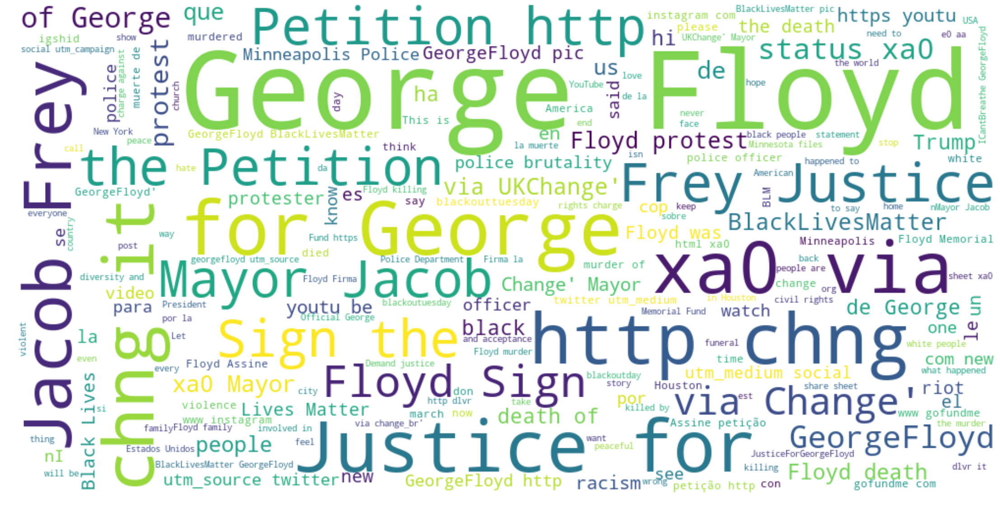

In [22]:
generate_word_cloud(gen_text_twitter("george floyd", limit=1000))

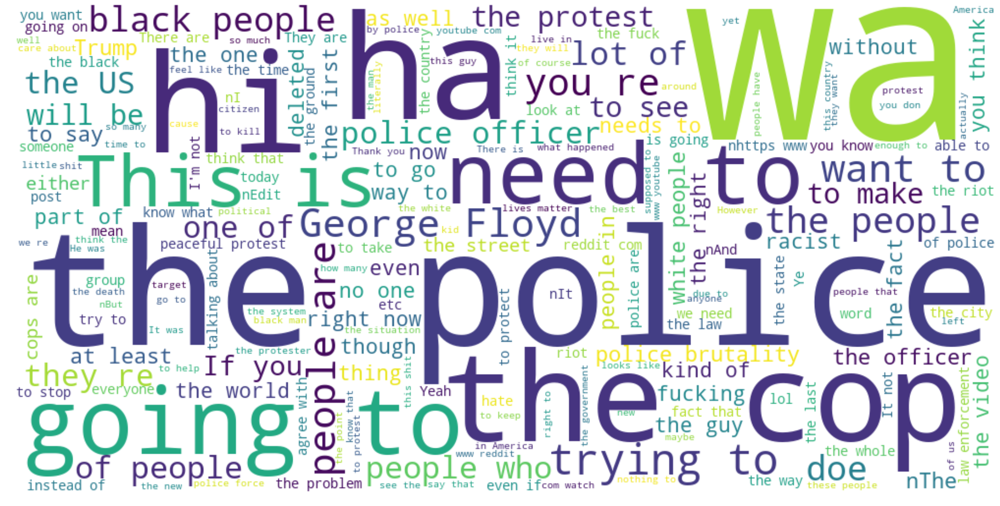

In [23]:
generate_word_cloud(gen_text_reddit("george floyd", limit=1000))

### Sentiment Analysis

In [22]:
from textblob import TextBlob
# Function to get sentiment 
def apply_blob(sentence):
    temp = TextBlob(sentence).sentiment[0]
    if temp == 0.0:
        return 0.0 # Neutral
    elif temp >= 0.0:
        return 1.0 # Positive
    else:
        return -1.0 # Negative

In [56]:
def plot_twitter_sentiment(keyword, limit):
    tweets = get_tweets(keyword, limit=limit).copy()
    tweets['sentiment'] = tweets['tweet'].apply(lambda x: apply_blob(x))
    plt.hist(tweets.sentiment)
    plt.title("Twitter sentiment: {} from {} tweets".format(keyword,str(limit)))
    plt.show()

In [57]:
def plot_reddit_sentiment(keyword, limit):
    reddits = pd.DataFrame(gen_text_reddit(keyword, limit=limit), columns=['reddit_text']) 
    reddits['sentiment'] = reddits['reddit_text'].apply(lambda x: apply_blob(x))
    plt.hist(reddits.sentiment)
    plt.title("Reddit sentiment: {} from {} posts".format(keyword,str(limit)))
    plt.show()

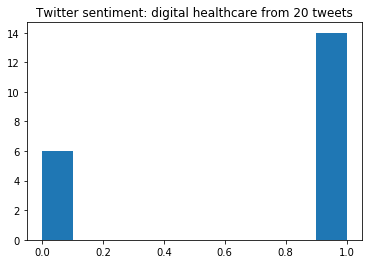

In [58]:
plot_twitter_sentiment("digital healthcare", limit=20)

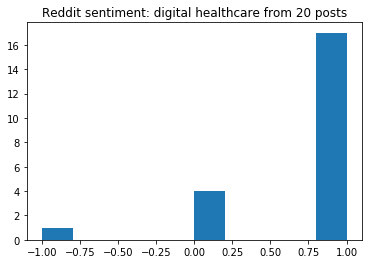

In [47]:
plot_reddit_sentiment("digital healthcare", limit=20)

## EDA on topics

In [79]:
search_limit = 1000

In [80]:
keywords = ['digital healthcare', 'symptom checker', 'telehealth', 'health apps', 'self diagnosis']

### 1.digital healthcare

Twitter wordcloud: digital healthcare

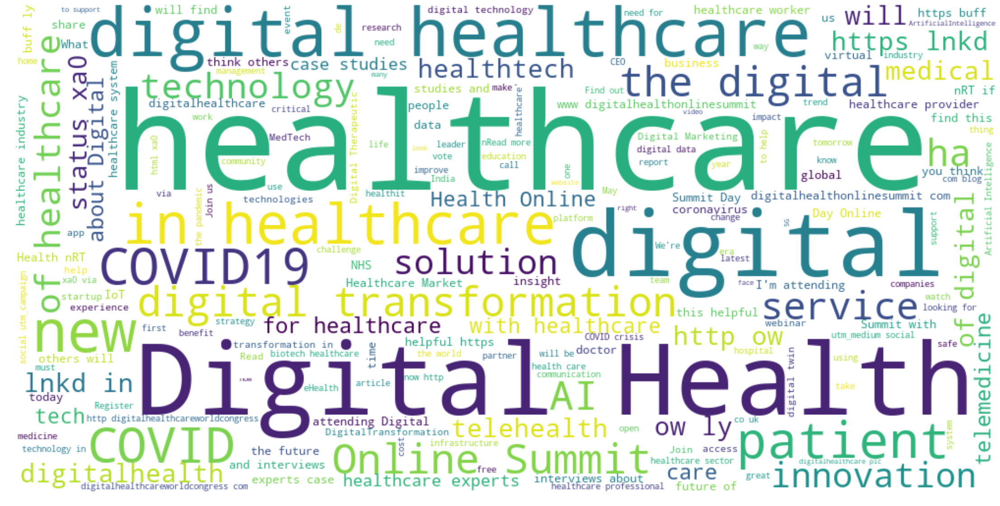

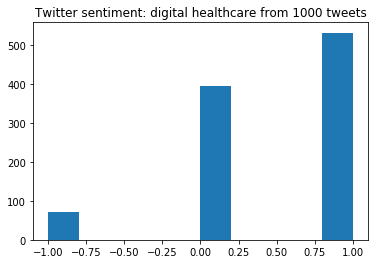

Reddit wordcloud: digital healthcare

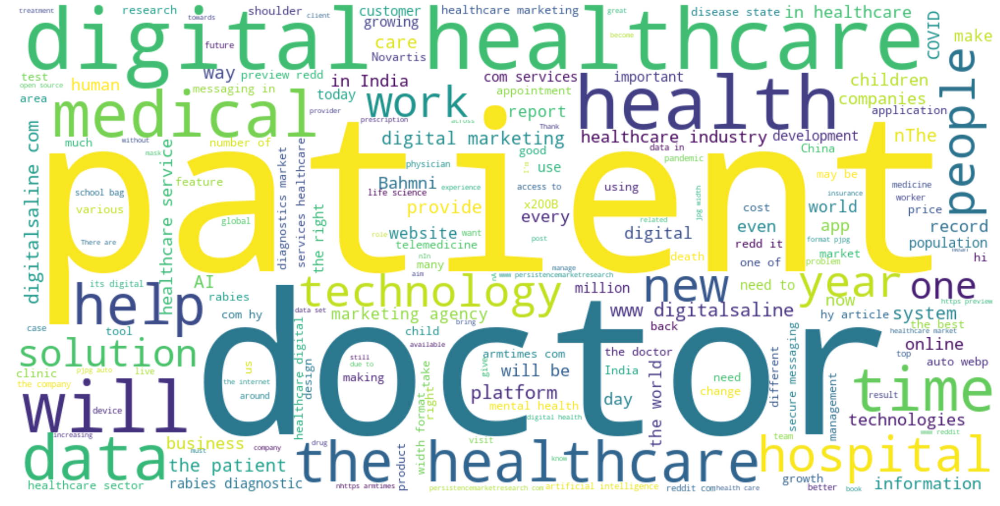

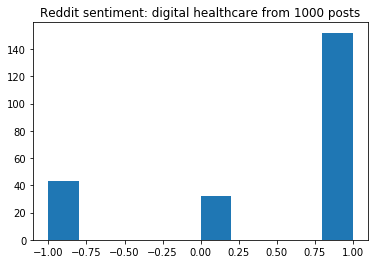

### 2.symptom checker

Twitter wordcloud: symptom checker

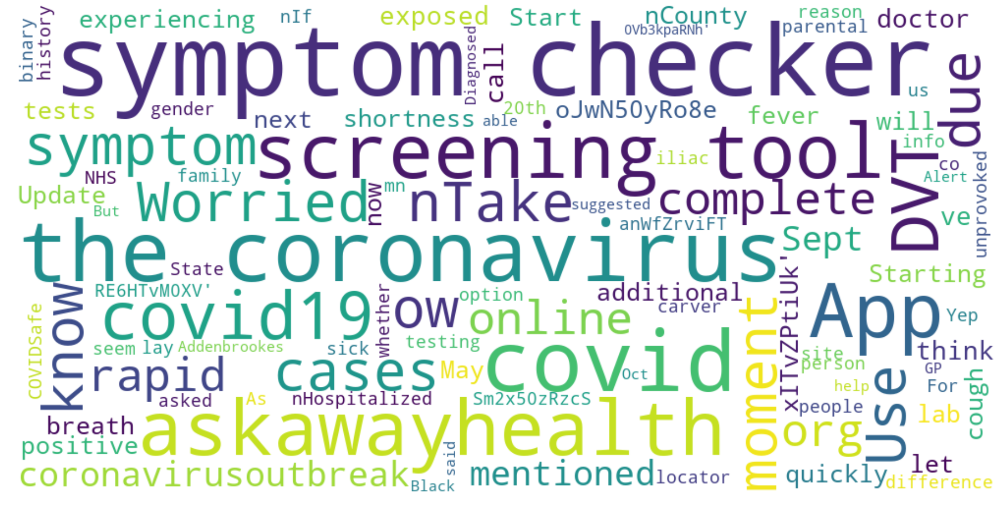

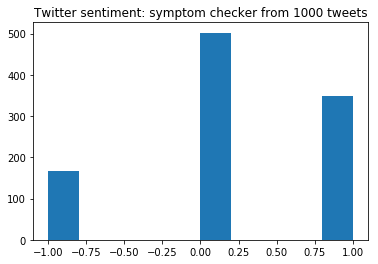

Reddit wordcloud: symptom checker

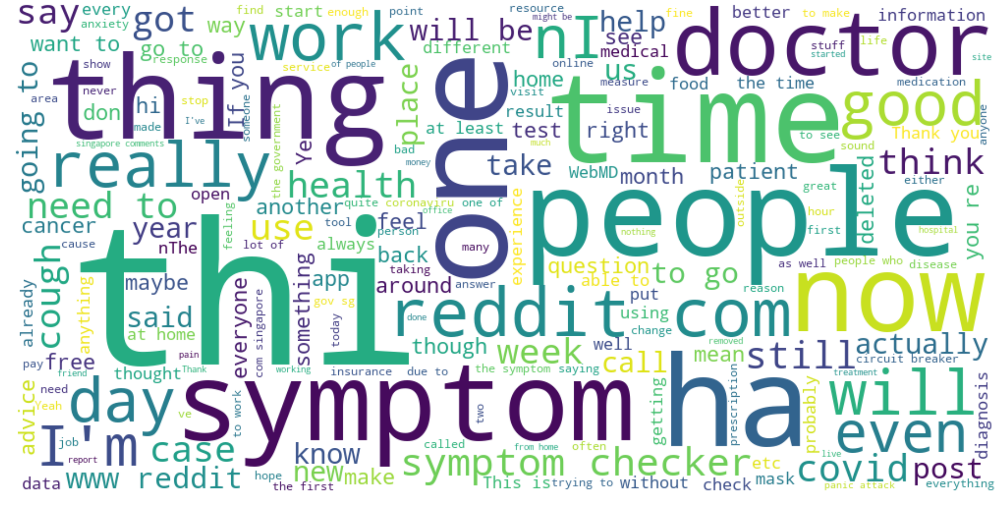

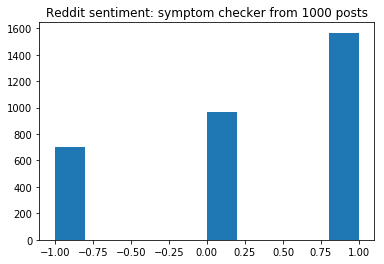

### 3.telehealth

Twitter wordcloud: telehealth

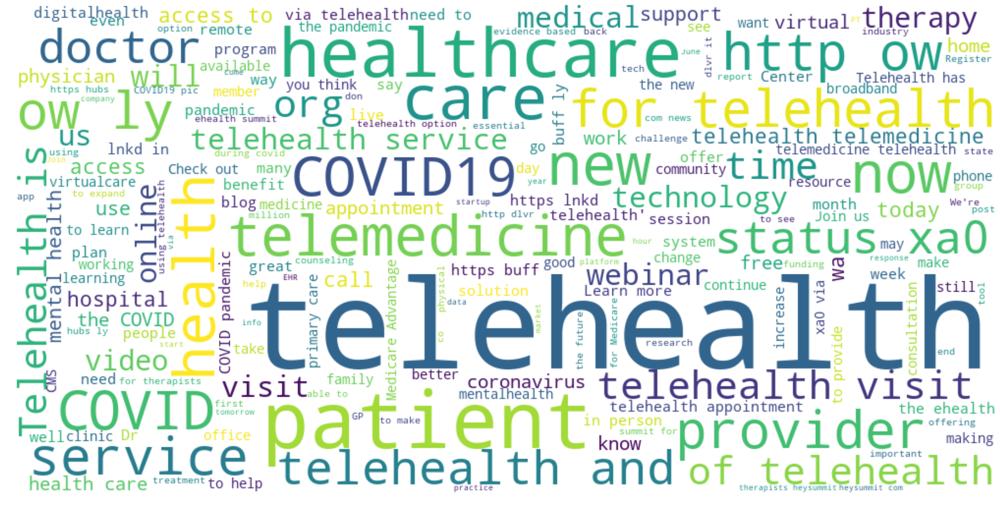

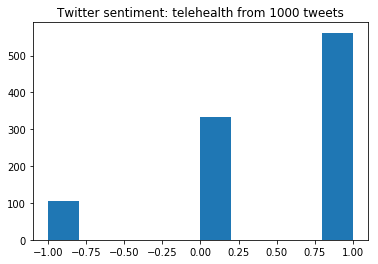

Reddit wordcloud: telehealth

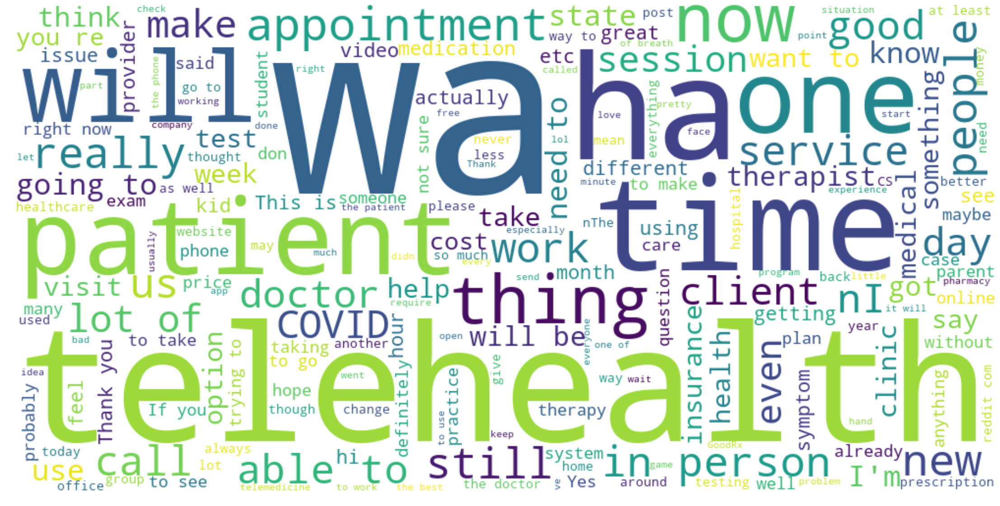

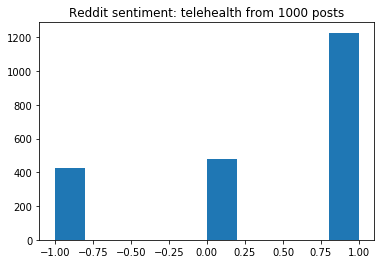

### 4.health apps

Twitter wordcloud: health apps

CRITICAL:root:twint.run:Twint:Feed:noDataExpecting value: line 1 column 1 (char 0)
sleeping for 1.0 secs


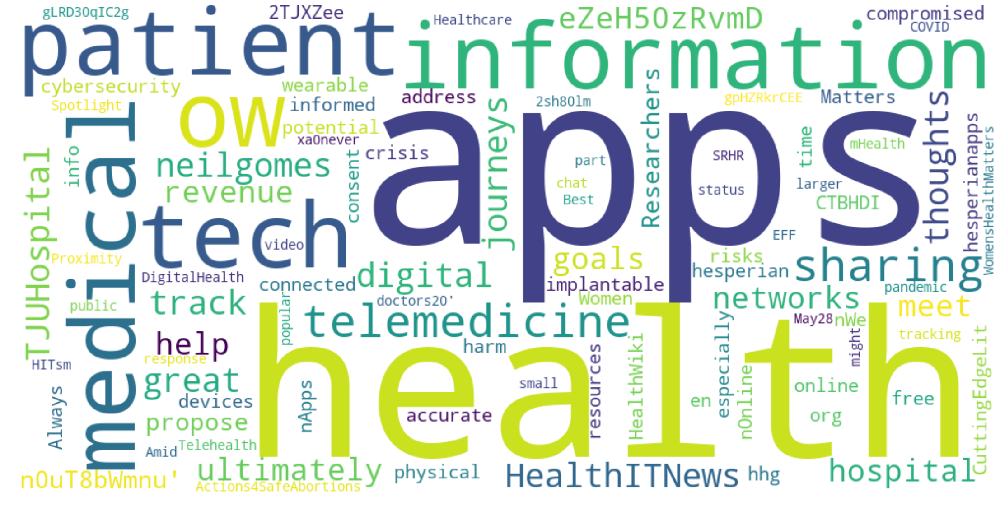

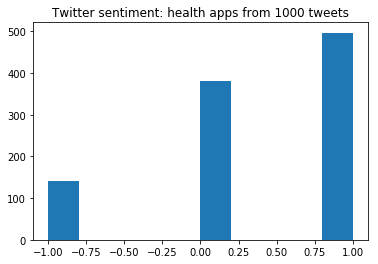

Reddit wordcloud: health apps

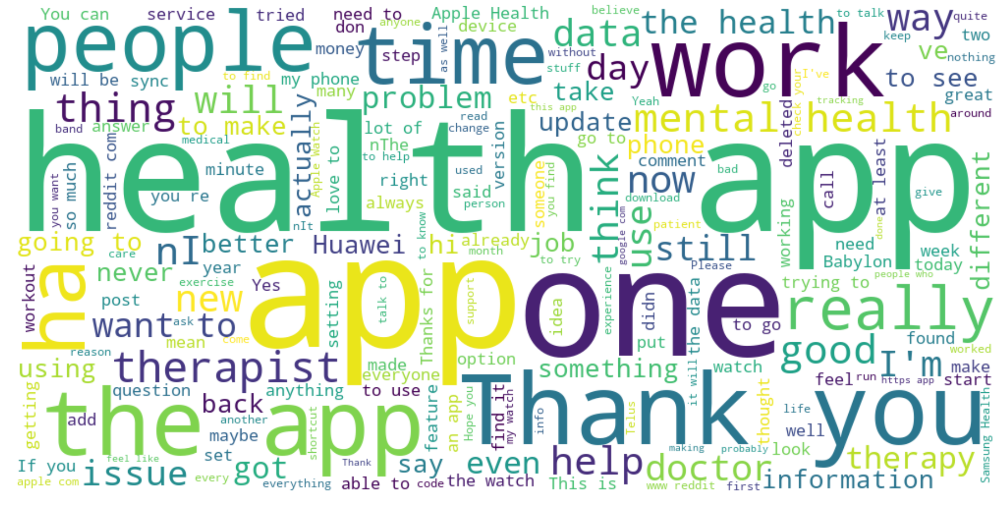

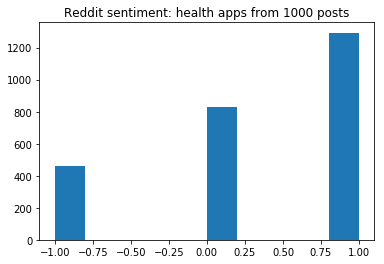

### 5.self diagnosis

Twitter wordcloud: self diagnosis

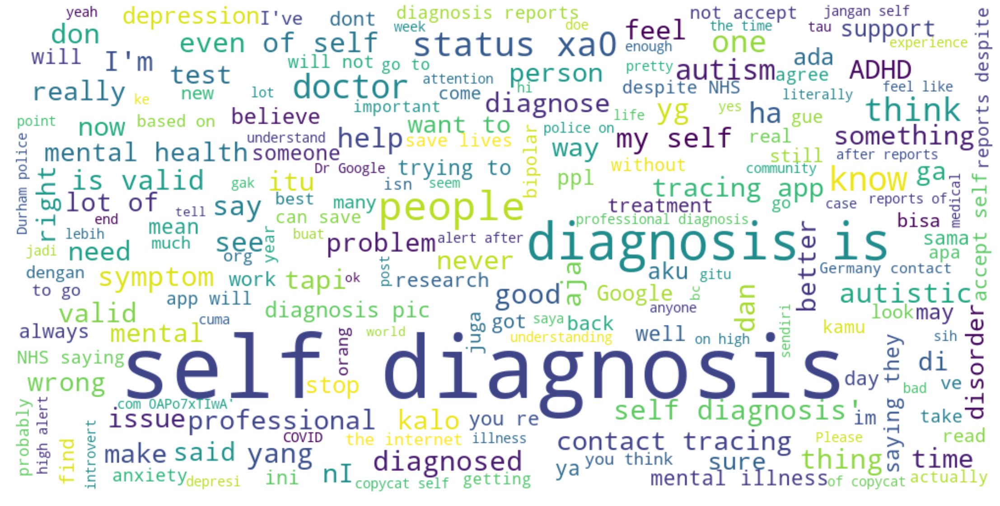

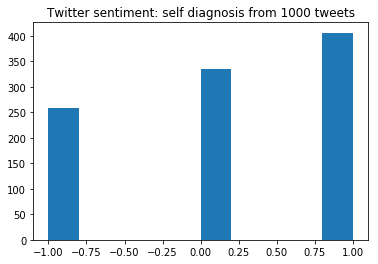

Reddit wordcloud: self diagnosis

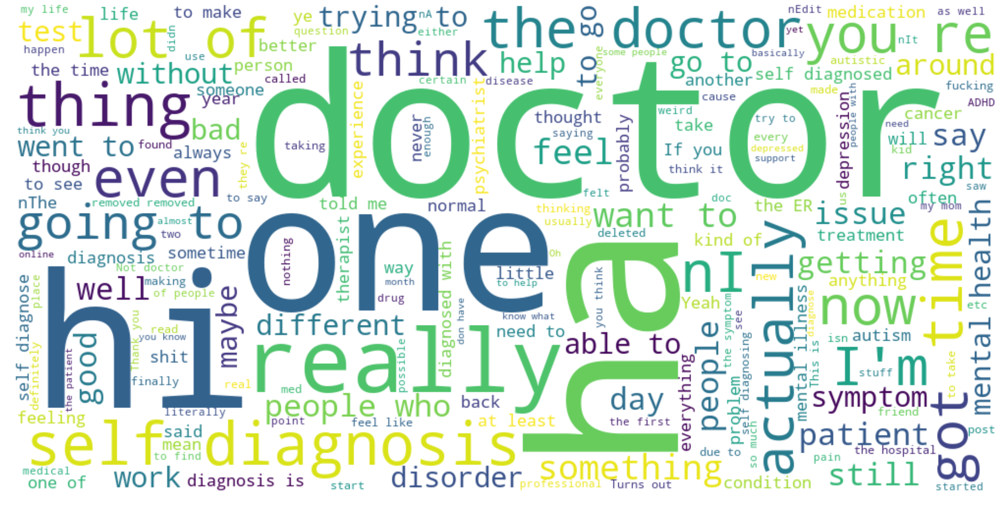

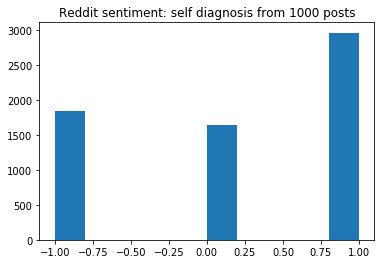

In [81]:
for i, keyword in enumerate(keywords):
    display(Markdown('### {}.{}'.format(i+1,keyword)))
    display(Markdown('Twitter wordcloud: {}'.format(keyword)))
    generate_word_cloud(gen_text_twitter(keyword, limit=search_limit))
    plot_twitter_sentiment(keyword, limit=search_limit)
    display(Markdown('Reddit wordcloud: {}'.format(keyword)))
    generate_word_cloud(gen_text_reddit(keyword, limit=search_limit))
    plot_reddit_sentiment(keyword, limit=search_limit)